> Технический прогон 14.09.2026: все расчётные ячейки этого отчёта выполнены последовательно в чистом ядре на указанных в коде исходных результатах. FEM заново не решалась. Исполнение отчёта не повышает доказательный статус исходного исследования.

# 20.16. Поперечная форма лёгкого и точность обратной модели боковых электродных сборок

**Вычислительный эксперимент на индивидуальной КТ-геометрии.** Рассматриваются четыре способа описания двух тканей: фоновых мягких тканей с эффективным удельным сопротивлением $\rho_1$ и лёгкого с сопротивлением $\rho_2$. Основной критерий сравнения — ошибка восстановления этих параметров по импедансам, а не только совпадение рассчитанных импедансов.

Работа продолжает [20.13 — сравнение геометрических приближений](20.13_Геометрия_лёгкого_и_ошибка_восстановления_сопротивлений.ipynb) и [20.14 — проверку прямой и обратной моделей](20.14_Две_проверки_моделей_с_литературными_сопротивлениями.ipynb). Место измерения зафиксировано по результатам [20.10 — КТ/FEM-локализация](20.10_КТ_FEM_локализация_боковых_матриц_МГТУ.ipynb). Выбор другого анатомического места относится к отдельной ветке 20.15. Связь базовых, дыхательных и пульсовых параметров рассматривается совместно с постановкой 31.05.

**Статус выводов.** Ниже приведены выполненные численные расчёты. Известные сопротивления задаются в синтетическом эксперименте; индивидуальная КТ определяет геометрию. Абсолютные сопротивления тканей добровольца независимо не измерены. Поэтому малая ошибка в этом эксперименте подтверждает пригодность приближения в заданной вычислительной постановке, но не устанавливает точность измерения сопротивлений у человека.

**Уточнённая цель вычислительной ветки, утверждённая автором 14.09.2026:** разработать и обосновать методику быстрого расчёта импеданса с точностью, достаточной для восстановления базовых, дыхательных и пульсовых параметров двух тканей. Исследуется возможность расчёта без метода конечных элементов (FEM). Допустимый итог — сохранить FEM как основной необходимый метод в проверенной области применения, если альтернативы не обеспечивают требуемой точности либо не дают практически значимого выигрыша во времени при сопоставимой точности. Критерии выбора, разделение выполненных и планируемых расчётов и научные источники приведены в разделе 12.1. Индивидуальная КТ на текущем этапе считается доступной; исключение КТ не является условием решения этой задачи.

## 1. Исследовательская задача и критерий результата

Одно число $h$ не описывает всю анатомию под сборкой. Расстояние от кожи до лёгкого меняется вдоль электродов; граница лёгкого изгибается поперёк их оси; около края лёгкого отдельный луч может пересечь лёгкое несколько раз или вовсе его не пересечь. Следовательно, совпадение центральной толщины не гарантирует совпадения электрического поля.

Проверяется гипотеза: **сохранение центрального среза и учёт изменяющейся поперечной формы лёгкого уменьшают ошибку обратного восстановления по сравнению с плоской двуслойной формулой и с одной общей поперечной кривизной.** Геометрические параметры приближений определяются только по КТ, до подгонки сопротивлений. Это позволяет отделить описание анатомии от электрической идентификации.

Последовательность проверки включает пять связанных вопросов:

1. Какие особенности реального среза теряются в каждом приближении?
2. Насколько эти потери меняют восстановление заранее известных $\rho_1$ и $\rho_2$?
3. Сохраняется ли результат при переходе от точечных электродов к конечным площадкам?
4. Как ошибки базовых параметров и дыхательной геометрии переходят в дыхательные и пульсовые изменения?
5. Насколько оценки устойчивы к небольшому изменению одного импеданса и допустимо ли считать глубину $L/3$ границей чувствительности?

Подбор окончательной пары сборок, восстановление неизвестного дыхательного движения по измерениям и проверка на других людях в этом ноутбуке не завершены. Для них получены исходные количественные оценки и обозначены необходимые проверки.

In [2]:
from pathlib import Path
import json, hashlib, sys
import numpy as np
import pandas as pd
from IPython.display import display, Image, HTML
import plotly.io as pio

here = Path.cwd().resolve()
project = next(p for p in [here, *here.parents] if (p/'MATLAB_TRKG4_real_subjects').is_dir())
root = project/'MATLAB_TRKG4_real_subjects'
out = root/'output/exploratory/transverse_geometry_20260911'
expected = {'geometry.json': '078d194aef9bb90fff40e0f3eb9b36529898fef8ca1a9022262df2374ff7335d', 'input_contract.json': 'f231228f20722b3f102fed0a27c9cad1ddf78e6e4d4fcea74c70174a8ab21fe0', 'pem_library.csv': 'c73642d73effd804b7a65ce06316828ae88630b95cde9f746e43641e2a0f9e68', 'inverse_recovery.csv': '8b8466a53038d4630e664e80ed00b229a26a3109f479076bb6c89cbb4d74a2a0', 'inverse_predictions.csv': '467bd12e822bf73c4f2c1b23e95935b5e5b6b2fd0c094903f6de51dbe3becd3e', 'interpolation_qc.csv': '5dd644b5bf852bea105e9a8ea20087b725696d2fa2227b003299f8498c89a24f', 'derivative_qc.csv': '6a7f43d239f9f60013fcf197a20cffcf7fdb5b7dc2e09245856aa9cbc99e5070', 'geometry_holdout.csv': 'edbe0a244f46c4eac121dd5920f258a5071748198a632ed8344a37fc6e15a0af', 'geometry_volumes.csv': '48a32bf1976489471a67df634d758447398ef4443e88e2ee67f821fd46032f8a', 'contacts.csv': '21120fd308feaeca08c0d730856a8da62653f4677250f8575c748e99e490b78a', 'central_profile.csv': '23946351c98b6eda251afb5faf0abb34bab7e2bae356f85381308224962f6a4a', 'cem_baseline.csv': '6463d02043c3cce183852bdff55d4586d39dbade0ad2039b51d928dc9f5c9e30', 'cem_inverse.csv': 'b3c55f474a32e2008474f8e874775611e6b6929cb8344cb33278f42e9c4909c5', 'cem_inverse_predictions.csv': 'c46cd269394e8555775539af3567280531835308638f9e06526e30265246fa4f', 'linked_scenarios.csv': '1825eafbba81f1b5242adabe368f209aee636f46bb2251a432335b9626dba43b', 'perturbations.csv': 'e45a9afbed7817fbed8eca7e805a159e396fd642d3507ea1351b7e3ed445da83', 'pair_diagnostics.csv': '90d06cb0c9f958d83c120799dc9a31873543cab6e511b71715d42e01a87bcdb7', 'geometry_control_recovery.csv': '499903007606d6c4ba86a7c6bd006ff1910079d3a8dbd599f6a344434cda10e6', 'depth_sensitivity_summary.csv': '210f2ba4e87aa6e4ad6ff0d6c6a0de798f568da3f60954e42a84ffd69d1b66b2', 'depth_sensitivity_curves.csv': '6759a6f51ff0609c8ccad2e1b3f4158335de99d4496e863130f0820f163bfeca', 'analysis_summary.json': '3dc0d55d8bab057f75e71abfdbb9e88acba5142476b294fc9e01c97cd0092aad', 'cem_inverse_summary.json': '846d956d5cfb112b950c397d9e5de55aa4b7298e6d15a686a47b6a4e01555d91', 'depth_execution.json': '54714df8d07dbdfef384795fb0f9c6b3b3cca3f0c6ed25c75f5cbabb9d39f31b'}
for name, digest in expected.items():
    with (out/name).open('rb') as f:
        assert hashlib.file_digest(f, 'sha256').hexdigest() == digest, f'Изменился расчётный вход: {name}'
labels = {'reference':'КТ-референс', 'planar':'1. Постоянная h', 'averaged':'2. Распределение h',
          'uniform_transverse':'3. Общая поперечная кривизна', 'variable_transverse':'4. Переменная поперечная форма'}
order = ['planar','averaged','uniform_transverse','variable_transverse','reference']
def table(frame, columns, decimals=3):
    view = frame[list(columns)].rename(columns=columns).copy()
    for col in view:
        if view[col].dtype == object:
            view[col] = view[col].replace(labels).replace({True:'да',False:'нет'})
    display(HTML(view.to_html(index=False, border=0, float_format=lambda x:f'{x:.{decimals}f}')))
def show_figure(name):
    display(Image(filename=str(out/'figures'/name)))
geometry = json.loads((out/'geometry.json').read_text(encoding='utf-8'))
inverse = pd.read_csv(out/'inverse_recovery.csv')
dynamic = pd.read_csv(out/'linked_scenarios.csv')
print(f'Проверено происхождение {len(expected)} расчётных файлов. Все последующие таблицы читают этот набор.')

Проверено происхождение 23 расчётных файлов. Все последующие таблицы читают этот набор.


## 2. Геометрия, положение сборок и происхождение данных

Используется ручная КТ-сегментация добровольца Ник на вдохе и построенная по ней сетка тела: **153 415 узлов и 721 943 тетраэдра**. Лёгочная область задаётся замкнутой поверхностью обоих лёгких. Для данной ветки все остальные объёмы, включая рёбра, сердце и ткани ниже диафрагмы, получают одно сопротивление $\rho_1$. Такое объединение утверждено как двухтканное допущение. Оно не означает, что кость или сердце имеют физические свойства мышцы, и не проверяет малость их самостоятельного вклада.

Центр сборок взят из дискретного поиска в 20.10; его обозначение в исходных результатах — **C01**. Координаты центра в системе исходной сетки составляют $(-187{,}500;\ 31{,}051;\ -138{,}051)$ мм. Угол поворота относительно базового направления поиска равен $14^\circ$. Это условный кандидат, найденный при фиксированных сопротивлениях исходной модели; использованное при поиске лёгочное сопротивление около 30,71 Ом·м выше верхней границы нынешнего основного теста. Выбор этого центра сохранён по решению автора, а не заново оптимизирован в текущей двухтканной области сопротивлений. Его нельзя считать доказанным фактическим местом наклейки или окончательным совместным оптимумом положения и двух сопротивлений.

**Принципиальное различие с предыдущими рисунками:** расстояние между этим центром и позой, использованной в прежних расчётах 20.13–20.14 и ранее присланном срезе, составляет **64,27 мм**. Поэтому ниже заново построены сечения именно для выбранного центра. Старые значения толщины и ранжирование моделей сюда не переносятся.

Локальная система координат состоит из оси $s$ вдоль сборки, оси $t$ поперёк сборки в касательной плоскости и направления $d$ внутрь тела. Базис ортонормирован и имеет положительную ориентацию. Начало находится в центре сборки. Координата $d$ отсчитывается от общей касательной плоскости; расстояние кожа–лёгкое рассчитывается отдельно и не равно $d$ при искривлённой коже.

Рассматриваются девять независимых номинальных размеров: **50, 60, 70, 80, 90, 110, 120, 130 и 140 мм**. Размер 100 мм исключён именно для этого добровольца как дубликат записи 90 мм. В синтетическом опыте каждый размер даёт один тетраполярный импеданс. Одновременное физиологическое состояние всех размеров задано конструкцией опыта; для последовательных реальных записей это остаётся допущением сопоставимости.

На рисунке 1 проверяется исходная причина усложнения модели: достаточно ли продлить один центральный контур в поперечном направлении?

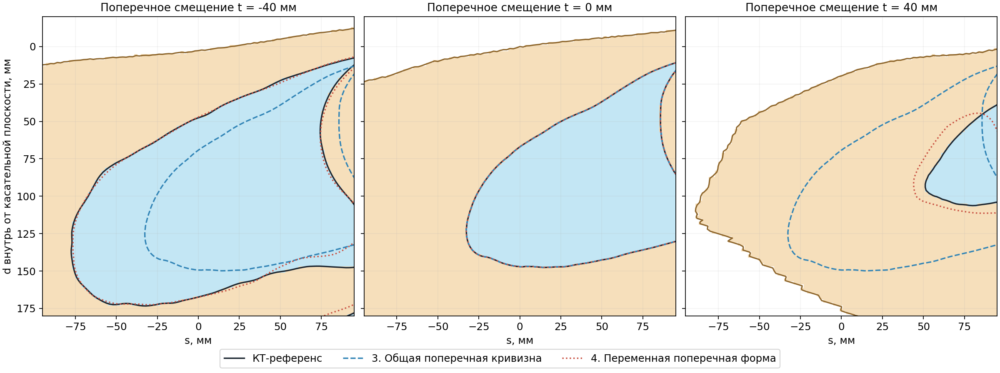

In [3]:
show_figure('01_ct_sections.png')

**Рисунок 1. Центральный и два смещённых среза индивидуальной геометрии.** Горизонтальная ось — $s$, вертикальная — $d$, обе в миллиметрах; глубина растёт вниз. Срезы соответствуют $t=-40$, $0$ и $40$ мм. Бежевый цвет обозначает фоновую ткань внутри тела, голубой — КТ-область лёгкого. Коричневая линия — кожа, чёрная — граница лёгкого по КТ. Синяя штриховая и красная пунктирная линии показывают два пространственных приближения, определённые в разделе 3.

В центральной плоскости обе аппроксимации совпадают с заданным контуром по построению. Поэтому оценивать их следует прежде всего по боковым панелям. При $t=40$ мм лёгочная область существенно сокращается и смещается вдоль $s$; единая симметричная поперечная кривизна этого не передаёт. Переменная модель лучше сохраняет эту асимметрию, хотя видимые расхождения у края остаются. Совпадение одной центральной линии, таким образом, недостаточно для трёхмерной геометрии.

Показаны контуры уровня геометрических полей в ограниченном окне. Продолжение пунктирной линии за кожу не создаёт проводящую ткань снаружи тела: электрическая задача решается только внутри общей сетки тела. Нижняя рамка рисунка также не является заданной плоской границей лёгкого. Эти ограничения важны при чтении объёмных изображений ниже.

Для плоских формул из тех же данных требуется получить толщину. Следующий рисунок показывает, какая часть исходной геометрии при этом сохраняется, а какая теряется.

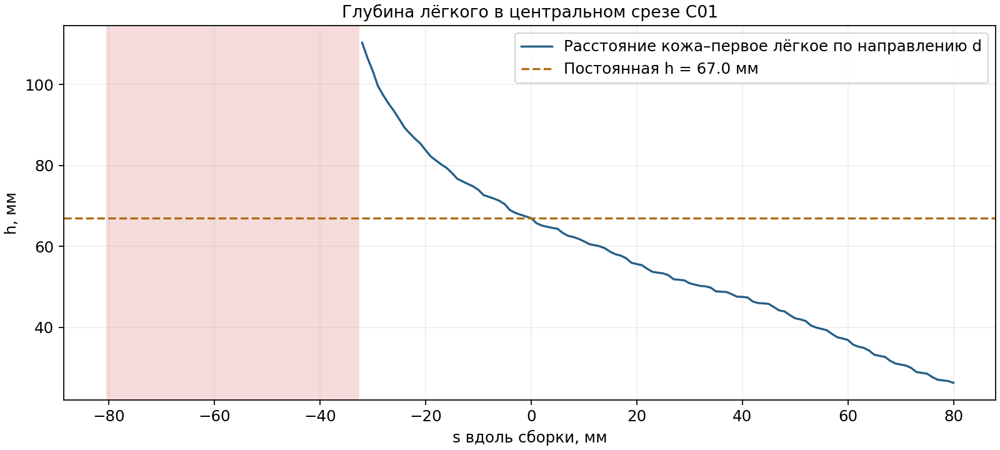

In [4]:
show_figure('02_depth_profile.png')

**Рисунок 2. Профиль глубины первого пересечения лёгкого в центральном срезе.** Для каждого $s$ строится луч по фиксированному направлению $d$. Величина $h(s)$ равна расстоянию от пересечения кожи до первого пересечения лёгкого на этом луче. Это направленная геометрическая толщина; она не является ни кратчайшим расстоянием между поверхностями, ни толщиной только мышц. По принятой двухтканной схеме лежащие между кожей и лёгким кости входят в фон.

В центре получено **$h(0)=67,00$ мм**. Горизонтальная штриховая линия показывает именно эту величину для первой модели; она не подбиралась по импедансам. Красным выделены позиции, где луч не пересекает лёгкое. В окне $s\in[-80;80]$ мм таких точек около **29,8%**. Это доля точек центрального профиля, а не доля чувствительного объёма. Само окно шире номинальной сборки 140 мм.

Там, где пересечения нет, во второй модели сохраняется $h=\infty$: соответствующее плоское ядро описывает однородный фон. Такие точки не удаляются и не заменяются средней толщиной. Если луч входит в лёгкое, выходит и затем снова входит, таблица геометрии сохраняет все пересечения; аналитическое приближение использует только первое. Поэтому даже полный профиль $h(s)$ ещё не задаёт форму лёгкого в объёме.

## 3. Четыре сравниваемые модели

Все модели содержат **два значения сопротивления**, но отличаются геометрией и способом вычисления электрического отклика. Термины «аналитическая» и «пространственная» характеризуют здесь способ задания задачи. Аналитическая формула использует специальное решение для плоской слоистой среды. Пространственная модель явно задаёт распределение тканей в трёх координатах и решает уравнение проводимости в этом объёме. Поле от четырёх локальных электродов является трёхмерным даже при неизменной форме сечений поперёк сборки.

| Модель | Сохраняемые данные | Основное упрощение |
|---|---|---|
| 1. Постоянная $h$ | Центральная направленная толщина по КТ; номинальные интервалы электродов | Плоская кожа, плоская граница, бесконечное по глубине лёгкое |
| 2. Распределение $h$ | Профиль первого пересечения вдоль $s$ | Усреднение отдельных плоских ядер без решения общего поля в неоднородной геометрии |
| 3. Общая поперечная кривизна | Центральный полный контур лёгкого, реальная кожа и монтаж | Один круговой поперечный профиль для всего центрального контура |
| 4. Переменная поперечная форма | Центральный контур, меняющаяся поперечная форма, реальная кожа и монтаж | Кубическая зависимость геометрического поля от $t$ |

**Плоский слой «фон–лёгкое–фон» с одинаковой нижней границей под всей сборкой исключён из основных кандидатов.** Он навязывает анатомии полный нижний слой фоновой ткани. Здесь фон появляется только там, где его действительно задаёт соответствующая лёгочная область. Число пересечений вдоль отдельных лучей может различаться; это не вводит третье сопротивление.

### 3.1. Плоская аналитическая модель

Потенциал на поверхности от единичного точечного источника в двуслойной среде определяется ядром

$$G(r,h,q)=\frac{1}{2\pi}\left[\frac{1}{r}+2\sum_{n=1}^{\infty}\frac{k^n}{\sqrt{r^2+(2nh)^2}}\right],\qquad
  k=\frac{q-1}{q+1},\quad q=\frac{\rho_2}{\rho_1},$$

где $G$ — ядро поверхностного потенциала на единицу сопротивления и тока, $r$ — расстояние между источником и точкой наблюдения, $h$ — толщина первого слоя, обе величины в метрах; $q$ — безразмерный контраст; $k$ — коэффициент отражения; $n$ — номер члена ряда. Для токовых электродов $A,B$ и измерительных $M,N$ передаточное сопротивление равно

$$Z=\rho_1\,[G(AM)-G(BM)-G(AN)+G(BN)],$$

где $Z$ — передаточное сопротивление, $\rho_1$ — сопротивление фоновой ткани; $AM,BM,AN,BN$ — расстояния между указанными электродами; аргументы $h,q$ у ядер для краткости опущены.

Номинальные координаты равны $(-L/2,-L/4,L/4,L/2)$. При $q=1$ ряд исчезает и получается однородный предел $Z=8\rho_1/(3\pi L)$. В вычислении оставлены 256 членов; диапазон контрастов обеспечивает быстрое убывание $|k|^n$. В первой модели во всех четырёх ядрах используется $h=h(0)$.

### 3.2. Усреднение плоских ядер по профилю толщины

Для каждой пары источник–приёмник ядро усредняется по участку центральной оси между ними:

$$\overline G_{ab}=\frac{1}{|s_b-s_a|}\int_{\min(s_a,s_b)}^{\max(s_a,s_b)}
    G(|s_b-s_a|,h(s),q)\,ds,$$

где $a,b$ — выбранные источник и приёмник, $s_a,s_b$ — их продольные координаты; $G$ — плоское ядро, $h(s)$ — направленная толщина, $q$ — контраст; $\overline G_{ab}$ — усреднённое ядро этой пары.

Затем четыре усреднённых ядра входят в ту же тетраполярную комбинацию. Интеграл рассчитан методом трапеций по профилю с шагом 1 мм и с добавлением концов каждой пары. Это проверяемая эвристика: она учитывает распределение глубин, но не описывает боковое перераспределение тока между участками. На объёмной схеме отдельные плоские фрагменты обозначают независимые ядра. Соединять их в одну ступенчатую проводящую границу и приписывать ей этот расчёт нельзя.

### 3.3. Пространственные модели по полю границы

Геометрия лёгкого представлена скалярным полем $\phi_{\mathrm{КТ}}(s,t,d)$: внутри лёгкого оно отрицательно, снаружи положительно, на границе равно нулю. Исходные значения получены как знаковое расстояние до замкнутой STL-поверхности. Центральное поле обозначено $\phi_0(s,d)=\phi_{\mathrm{КТ}}(s,0,d)$. После аппроксимации значения поля не обязательно равны истинному расстоянию до новой поверхности; для назначения ткани используется их знак.

В третьей модели центральное поле сдвигается в глубину по одной круговой функции:

$$\phi_3(s,t,d)=\phi_0(s,d-g_\kappa(t)),\qquad
  g_\kappa(t)=\frac{\kappa t^2}{1+\sqrt{1-\kappa^2t^2}},$$

где $\phi_3$ — поле третьей модели, $\phi_0$ — центральное поле, $s,t,d$ — локальные координаты; $g_\kappa$ — глубинный сдвиг, $\kappa$ — его знаковая круговая кривизна.

Единственный параметр $\kappa$ определяется по КТ; нулевой предел допускает прямое поперечное продолжение. Получено $\kappa=0{,}002778$ мм$^{-1}$, то есть радиус около **360 мм**. Одна и та же функция применяется ко всему центральному контуру. Это точный смысл «общей кривизны» в данном опыте; такое построение не утверждает, что все главные кривизны итоговой поверхности одинаковы.

В четвёртой модели используется

$$\phi_4(s,t,d)=\phi_0(s,d)+a_1(s,d)\tau+a_2(s,d)\tau^2+a_3(s,d)\tau^3,\qquad \tau=t/(65\,\text{мм}),$$

где $\phi_4$ — поле четвёртой модели, $\phi_0$ — центральное поле, $a_1,a_2,a_3$ — пространственные карты коэффициентов, $\tau$ — нормированная поперечная координата; $s,t,d$ — локальные координаты.

Три поля коэффициентов определены методом наименьших квадратов по КТ-срезам. Нечётные степени позволяют передать поперечную асимметрию. При $t=0$ обе модели точно сохраняют центральное поле; многократные пересечения луча остаются допустимыми. Четвёртая модель содержит карты коэффициентов, а не всего три числа. Следовательно, это ещё не доказанно минимальное описание анатомии.

Для интерполяции используется сетка с шагами 2 мм по $s$, 5 мм по $t$ и 2 мм по $d$. Новая геометрия полностью действует в центральной области $|s|\le95$ мм, $|t|\le45$ мм, $-10<d\le180$ мм. На боковых и глубокой границах она плавно сопрягается с исходной КТ через произведение косинусных окон; вне области $|s|<115$ мм, $|t|<65$ мм, $-10<d<220$ мм сохранена КТ-геометрия. На верхней границе $d=-10$ мм явно действует ограничение области модификации.

Сопряжение с КТ — дополнительное условие эксперимента. Оно позволяет исследовать локальную замену при общей внешней анатомии, но сохраняет зависимость от КТ за пределами окна. Кривизна подбирается в полосе исходного геометрического поля шириной 12 мм при $0\le d\le180$ мм; сопротивления при этом не используются.

### 3.4. Дополнительные модели включения в полупространстве

**Предложение автора от 14.09.2026; расчёты ещё не выполнены.** К существующим моделям внутри конечной КТ-геометрии тела добавляются два основных варианта: криволинейное лёгкое в мягкотканном полупространстве с одинаковым и с переменным сечением поперёк сборки. Это отдельное упрощение наружной границы. Результаты и рисунки основного опыта ниже по-прежнему относятся к исходным четырём моделям.

Полупространство задаётся условием $d>0$, его граница $d=0$ заменяет кожу. Направления $s,t,d$ сохраняют смысл локальных координат раздела 2. Лёгочная область получает сопротивление $\rho_2$, всё остальное полупространство — $\rho_1$. Над плоскостью ток не распространяется. На свободной части плоскости нормальный ток равен нулю, ток вводится и выводится через электроды; вдали от них потенциал стремится к нулю. Дальняя и боковые границы конечного КТ-объёма в этой постановке отсутствуют.

Обозначение H далее означает полупространство (half-space). Оно относится к модели, а номера 3.1 и 3.2 выше остаются номерами разделов о плоских аналитических приближениях.

| Вариант | Наружная граница | Лёгочная геометрия | Статус |
|---|---|---|---|
| М3, существующая | КТ-поверхность тела | Один центральный контур с общим поперечным изгибом | FEM-расчёт выполнен |
| М4, существующая | КТ-поверхность тела | Переменная поперечная форма | FEM-расчёт выполнен |
| М3-H, новый основной вариант | Плоскость, фон неограничен в глубину и в стороны | Строго одинаковый криволинейный контур при всех $t$ | Предлагается рассчитать |
| М4-H, новый основной вариант | Та же плоскость и полупространство | Криволинейная поверхность с изменением сечений по $t$ | Предлагается рассчитать |

**Постоянное сечение и общий изгиб различаются.** В строгом варианте М3-H граница задаётся

$$\phi_{\mathrm{3H}}(s,t,d)=\phi_0(s,d),$$

где $\phi_{\mathrm{3H}}$ — геометрическое поле нового варианта, $\phi_0$ — поле полного центрального контура из раздела 3.3, $s,t,d$ — локальные координаты. Форма и положение сечения не зависят от $t$; продольная кривизна контура и неодинаковая глубина вдоль $s$ сохраняются. Лёгочная область является обобщённым цилиндром, бесконечным вдоль $t$. Это явная геометрическая идеализация. Если для вычисления используется конечная ширина с замыканием на концах, её влияние проверяется расширением области; концы не считаются анатомически установленными.

Существующая М3 имеет ненулевой общий изгиб $g_\kappa(t)$ и не совпадает с этой экструзией. Поэтому нужен дополнительный контроль **М3-Hκ**: тот же закон $\phi_0(s,d-g_\kappa(t))$, что у М3, но в полупространстве. Пара М3 и М3-Hκ проверяет замену внешней геометрии при одинаковом описании лёгкого; пара М3-Hκ и М3-H показывает цену отказа от общего изгиба. При конечном продолжении поверхности его правило должно быть одинаковым в сопоставляемой паре.

Для М4-H в исходном локальном окне используется переменная форма из раздела 3.3, а затем исследуется её компактное описание. КТ-карты коэффициентов и кубический полином нельзя автоматически экстраполировать на всё полупространство. До расчёта требуется явно задать полную лёгочную поверхность, её глубокое и боковое продолжение и замыкание либо асимптотическое поведение. Сохранение исходной КТ вне окна допускается как промежуточный контроль, но не считается окончательным компактным описанием. Поверхность не должна пересекать кожу. Ткань ниже диафрагмального края появляется только вне лёгочной области; полный плоский слой фона под всем лёгким не вводится.

Даже при неизменном сечении геометрии ток от локальных точечных или конечных электродов распространяется в трёх измерениях. Обычное двумерное решение с линейными источниками не воспроизводит такую сборку. Возможность уменьшить размерность расчёта для М3-H требует сохранения трёхмерного источника, например посредством преобразования по координате $t$ и обратного интегрирования; это отдельный предлагаемый способ решения.

#### 3.4.1. Плоская кожа и функция Грина полупространства

Для изолирующей плоскости применяется сумма полей источника и его зеркального изображения того же знака. В нормировке $-\Delta_{\mathbf x}G_N=\delta(\mathbf x-\mathbf y)$ внутри полупространства ядро имеет вид

$$G_N(\mathbf x,\mathbf y)=\frac{1}{4\pi}
\left(\frac{1}{|\mathbf x-\mathbf y|}+
\frac{1}{|\mathbf x-\mathbf y^\ast|}\right),\qquad
\mathbf y^\ast=(s_y,t_y,-d_y),$$

где $\mathbf x$ — точка наблюдения, $\mathbf y=(s_y,t_y,d_y)$ — источник, $\mathbf y^\ast$ — его отражение в плоскости $d=0$, $\delta$ — дельта-функция, $\Delta_{\mathbf x}$ — оператор Лапласа по координатам наблюдения; $G_N$ имеет размерность м$^{-1}$. Производная по нормали на плоскости равна нулю вне источника. Знак «плюс» соответствует изоляции; противоположный знак задавал бы нулевой потенциал на плоскости. Построение приведено в [лекционных материалах U. H. Kurzweg, раздел «Neumann function for the infinite half space problem»](https://web.mae.ufl.edu/uhk/mathfunc.htm).

Для токовых точек $A,B$ на плоскости однородное фоновое поле равно

$$u_0(\mathbf x)=\frac{\rho_1 I}{2\pi}
\left(\frac{1}{|\mathbf x-\mathbf A|}-
\frac{1}{|\mathbf x-\mathbf B|}\right),$$

где $u_0$ — потенциал без лёгочного включения, $I$ — вводимый в $A$ и выводимый из $B$ ток, $\rho_1$ — сопротивление фона, $\mathbf A,\mathbf B$ — координаты токовых электродов. Множитель $1/(2\pi)$ получается при совпадении источника на плоскости с его отражением. Это аналитическое фоновое решение; поправка от лёгкого требует решения условий непрерывности потенциала и тока на его границе.

**Предлагаемое применение:** использовать $G_N$ в поверхностных интегральных уравнениях включения, опираясь на общую постановку [Stenroos, 2016](https://arxiv.org/pdf/1605.00923v3#page=2). Тогда свободную бесконечную плоскость не требуется покрывать сеткой. Это устраняет одну из поверхностей численного расчёта, но заранее не устанавливает выигрыш во времени. Для конечных электродов добавляются неизвестные на площадках и условия полной электродной модели; равномерное распределение тока по площадке нельзя молча считать эквивалентом CEM. Контраст сопротивлений тканей не предполагается малым: ограничение первым приближением по контрасту, если оно будет испытано, отмечается как дополнительное допущение.

#### 3.4.2. Согласование геометрии и порядок сравнений

Первым контролем служит **КТ-H**: исходная полная лёгочная поверхность сохраняется, а конечная наружная поверхность тела заменяется полупространством. В качестве первичного правила перехода выбирается касательная плоскость в центре сборки: координаты лёгкого в локальном ортонормированном базисе не деформируются, контакты переводятся в $(s_i,t_i,0)$. Индекс $i$ обозначает контакт. Глубины относительно новой плоскости и межэлектродные расстояния пересчитываются явно; вся карта расстояний кожа–лёгкое при таком переходе не сохраняется автоматически.

Перевод электродов на плоскость является частью изменения постановки. Поэтому разность с исходным КТ-расчётом характеризует замену наружной границы вместе с согласованным переводом контактов, а не только кривизну кожи. Величины перемещения контактов и изменения расстояний фиксируются отдельно. Для конечных площадок сохраняются заданные площади и контактные сопротивления, а способ переноса формы площадки описывается как дополнительное геометрическое условие.

Порядок проверки: исходная КТ против КТ-H → М3 против М3-Hκ и М4 против М4-H при согласованной полной форме лёгкого → М3-Hκ против М3-H → сокращение формы и оператора. Так разделяются влияние наружной геометрии, общего изгиба, переменной формы и численного метода. Чистая ошибка решателя проверяется на одинаковой математической задаче; для FEM-проверки полупространства необходимо отдельно контролировать приближение бесконечной области конечной областью.

Для каждого перехода применяются критерии раздела 12.1: ошибка импеданса, производных, восстановленных базовых и изменяющихся сопротивлений, а также подготовка и повторные вычисления. Нельзя автоматически переносить на варианты H точность исходных М3 и М4 или приписывать им преимущество по скорости. Разумный результат опыта может состоять как в принятии полупространства для определённых монтажей, так и в необходимости сохранить наружную КТ-геометрию.

In [5]:
volume_figure = pio.from_json((out/'figures/03_four_models_3d.json').read_text(encoding='utf-8'))
display(HTML(pio.to_html(volume_figure, include_plotlyjs=True, full_html=False,
                        config={'responsive':True, 'displaylogo':False})))

**Рисунок 3. Объёмное представление четырёх моделей.** Каждую панель можно вращать мышью; масштаб по всем осям задан в миллиметрах. Бирюзовые поверхности показывают границы лёгочной области, полупрозрачная бежевая поверхность — кожу. Точки обозначают электроды сборки 140 мм. В аналитических моделях показаны номинальные точки на плоскости; в пространственных — узлы точечных контактов на индивидуальном теле.

Вторая панель изображает набор независимых локальных плоских ядер, а не общую ступенчатую среду. В третьей и четвёртой панелях показана аппроксимация фактических КТ-данных выбранного центра. Обрезанные края поверхности обусловлены окном изображения; их нельзя принимать за физическую нижнюю границу лёгкого. Сопоставление панелей показывает, что переход от первой модели ко второй добавляет сведения о толщине, а переход к пространственным моделям добавляет ещё и совместное распределение тока в объёме.

Поскольку прозрачные поверхности могут перекрывать друг друга, следующий рисунок отдельно показывает поперечные сечения двух пространственных вариантов.

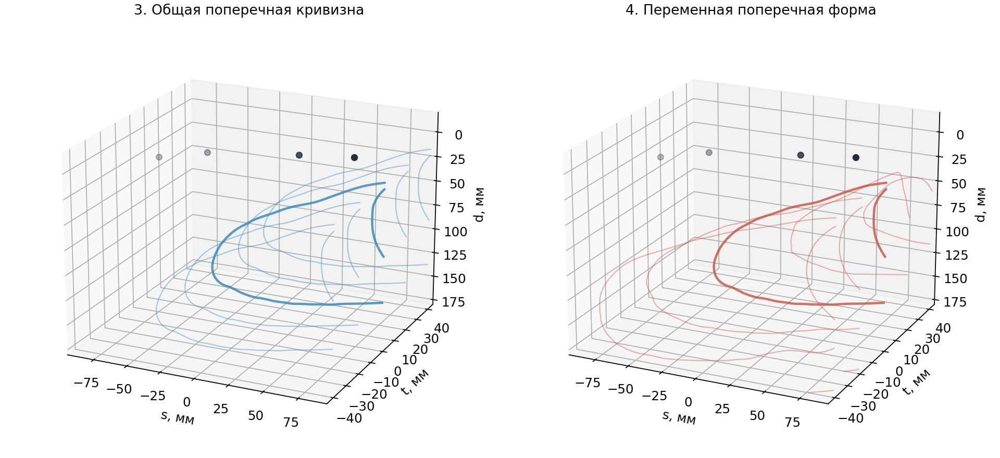

In [6]:
show_figure('04_transverse_profiles_3d.png')

**Рисунок 4. Семейства контуров двух пространственных моделей.** Линии соответствуют $t=-40,-20,0,20,40$ мм; центральный контур выделен сильнее. Электроды показаны тёмными точками. В модели общей кривизны сохраняется одна форма, сдвигаемая по общей круговой зависимости. В переменной модели меняются положение и очертания сечений. Именно второе различие было видно на боковых панелях рисунка 1.

Изображение подтверждает различие геометрических гипотез, но визуальная правдоподобность не даёт численной оценки точности сопротивлений. Сначала измерим расхождение геометрических полей на сечениях, не участвовавших в их построении, а затем проверим обратную задачу.

## 4. Геометрическая проверка до электрической подгонки

Проверочные поперечные плоскости расположены между исходными плоскостями сетки, на половине шага по $t$. На них непосредственно вычислено исходное знаковое расстояние до КТ-поверхности. Ошибки сравниваются в полосе $|\phi_{\mathrm{КТ}}|<8$ мм при $|s|\le95$ мм, $|t|\le45$ мм и $0\le d\le180$ мм. Геометрия приближений не подгоняется к этим проверочным значениям.

Таблица 1 содержит среднеквадратичное и максимальное расхождение значений полей, а также долю точек с разным знаком. Последняя характеризует ошибку назначения ткани в этой проверочной полосе. Это не доля всего объёма лёгкого. Миллиметровые ошибки полей нельзя без отдельного расчёта отождествлять со смещением плевры или расстоянием Хаусдорфа между поверхностями.

In [7]:
check = pd.read_csv(out/'geometry_holdout.csv')
check.loc[check.model=='grid_control','model'] = 'Интерполяция исходной КТ'
check['sign_pct'] = 100*check.sign_disagreement_fraction
table(check, {'model':'Представление', 'heldout_near_boundary_rms_mm':'СКО поля, мм',
              'heldout_near_boundary_max_mm':'Максимум, мм','sign_pct':'Различие знака, %'})

Представление,"СКО поля, мм","Максимум, мм","Различие знака, %"
Интерполяция исходной КТ,0.100,2.035,0.288
3. Общая поперечная кривизна,13.056,40.118,38.801
4. Переменная поперечная форма,1.566,9.942,6.201


**Результат геометрической проверки.** Среднеквадратичное расхождение уменьшилось с **13,06 до 1,57 мм**, а доля несовпадающих знаков — с **38,8 до 6,2%** при переходе от общей кривизны к переменной форме. Контроль одной интерполяции исходного поля даёт около 0,10 мм и 0,29%. Следовательно, основное различие между двумя приближениями превышает ошибку самого геометрического интерполирования.

На тетраэдральной сетке объём симметрической разности с исходной лёгочной маской составляет **0,766 л** для общей кривизны и **0,072 л** для переменной формы; контроль интерполяции меняет около **0,0046 л**. Объём симметрической разности учитывает и ошибочно добавленную, и ошибочно удалённую ткань. Близость общего объёма лёгкого сама по себе может скрыть взаимную компенсацию этих ошибок.

Более точная геометрия четвёртой модели теперь установлена в рамках выбранных метрик. Следующий этап проверяет, насколько это преимущество сохраняется для электрического поля и восстанавливаемых сопротивлений.

## 5. Электрическая задача, контакты и численная проверка

Принята квазистатическая резистивная постановка с действительными скалярными сопротивлениями. Внутри тела выполняется

$$\nabla\!\cdot(\sigma\nabla u)=0,\qquad
  \sigma(\mathbf x)=\begin{cases}1/\rho_2,&\mathbf x\in\Omega_{\mathrm{лёгкого}},\\1/\rho_1,&\text{остальной объём тела}.\end{cases},$$

где $u$ — электрический потенциал, $\sigma$ — проводимость, $\mathbf x$ — пространственная координата, $\Omega_{\mathrm{лёгкого}}$ — лёгочная область, $\rho_1,\rho_2$ — сопротивления двух тканей.

На границе тканей непрерывны потенциал и нормальная плотность тока. Свободная поверхность тела электрически изолирована. Между крайними электродами задаётся ток, а внутренние регистрируют разность потенциалов. Искомый передаточный импеданс $Z=(U_{V+}-U_{V-})/I$ в этой постановке является действительным сопротивлением, выраженным в омах. Сопротивления тканей выражены в Ом·м. Частотная дисперсия, комплексная диэлектрическая проницаемость и мышечная анизотропия здесь не моделируются.

**Основное сравнение состояний выполнено с точечными электродами** — моделью PEM. Для каждого из 36 контактов выбран ближайший поверхностный узел к центроиду фактической площадки. Точечные контакты внутри пространственной группы общие; токовая и сопряжённая измерительная задачи решаются на одной сетке. Расстояние от центроида площадки до узла составляет 0,42–3,66 мм. Поэтому точечное приближение включает также дискретизацию положения контакта.

**Отдельный опыт выполнен с конечными электродами** — полной электродной моделью CEM. На каждой площадке потенциал электрода постоянен, потенциал ткани связан с ним контактным сопротивлением, а интегральный ток задан. Для измерительных площадок интегральный ток равен нулю; локальное перераспределение тока при этом возможно. Принято удельное контактное сопротивление $z_c=1{,}59155\cdot10^{-4}$ Ом·м², перенесённое из конфигурации проекта. Номинальная площадь равна 70,686 мм², воспроизведённые дискретные площади лежат в пределах **70,783–94,195 мм²**. Площади и центроиды всех площадок совпали с сохранёнными данными выбранного кандидата; действующий геометрический контроль пройден. Это проверка воспроизведения принятого дискретного контакта, а не независимое измерение его физической площади.

В обоих опытах используется нормировка на ток **1 А**. Это вычислительный единичный ток линейной задачи, а не утверждение о токе прибора или предложение протокола на человеке.

### 5.1. Быстрый расчёт по библиотеке полей

Для фиксированной геометрии и точечных электродов справедливо масштабирование

$$\mathbf Z(\rho_1,\rho_2)=\rho_1\,\mathbf f(q),\qquad q=\rho_2/\rho_1,$$

где $\mathbf Z$ — вектор девяти импедансов, $\mathbf f$ — нормированный отклик данной геометрии, $q$ — контраст сопротивлений.

Для каждой из трёх пространственных геометрий — КТ-референса и двух приближений — FEM вычисляет $\mathbf f$ и её производную по $\ln q$ в 19 опорных точках. Между ними построена кубическая интерполяция Эрмита. Дополнительные значения контраста использованы для независимых проверок и формирования заданных состояний; они не добавлялись в опорную сетку интерполяции.

Нормировка по контрасту служит сокращению вычислений. **Физиологическая постановка остаётся двумерной по реальным $\rho_1$ и $\rho_2$**: все основные заданные состояния и все ограничения инверсии проверяются в Ом·м. Вспомогательные нормированные задачи $\rho_1=1$, $\rho_2=q$ не выдаются за физиологические состояния.

После подготовки библиотеки перебор сопротивлений не требует нового FEM-решения. Однако сама библиотека обучена на FEM для одной геометрии. Это уже ускорение повторной инверсии, но ещё не независимый от FEM и индивидуальной КТ универсальный решатель. Для CEM при фиксированном $z_c$ простое масштабирование сразу двух сопротивлений не является точным; поэтому конечные электроды проверены прямой нелинейной подгонкой CEM.

**Ускорение библиотекой доступно и полной КТ-геометрии.** Все три пространственных варианта здесь решаются на одной тетраэдральной сетке; уменьшение сложности поверхности само по себе не уменьшило размер FEM-системы. После предварительных полевых расчётов весь Python-анализ инверсий и сценариев занял в этом запуске около 2,1 с. Это время одного запуска анализа, без подготовки геометрии, FEM, CEM и оформления отчёта, а не гарантированное время клинической процедуры. Преимущество четвёртой модели по времени относительно библиотеки полной КТ отдельно не установлено.

### 5.2. Что проверено численно

Проверены взаимность, невязка линейной системы, однородный предел разных тканевых масок, производные по сопротивлениям и интерполяция на дополнительных контрастах. CEM-матрица для исходной геометрии и сборки 140 мм независимо сопоставлена с матрицей EIDORS. При сборке CEM устранена только асимметрия округления: перед разложением Холецкого проверено её относительное значение менее $10^{-12}$; невязка затем вычислена относительно исходной матрицы.

In [8]:
lib = pd.read_csv(out/'pem_library.csv')
cem_base = pd.read_csv(out/'cem_baseline.csv')
iq = pd.read_csv(out/'interpolation_qc.csv')
dq = pd.read_csv(out/'derivative_qc.csv')
table(pd.DataFrame([
    ['Максимальная невязка PEM',lib.relative_residual.max()],
    ['Максимальная невязка CEM',cem_base.relative_residual.max()],
    ['Нарушение взаимности PEM, Ом при ρ₁=1',lib.reciprocity_abs.max()],
    ['Нарушение взаимности CEM, Ом',cem_base.reciprocity_abs.max()],
    ['Максимальная ошибка интерполяции, Ом',iq.max_Z_error_ohm.max()],
    ['Максимальная относительная ошибка производной',dq.max_relative_error.max()],
],columns=['test','value']), {'test':'Проверка','value':'Полученное значение'}, decimals=10)

Проверка,Полученное значение
Максимальная невязка PEM,0.0000000004
Максимальная невязка CEM,0.0000000005
"Нарушение взаимности PEM, Ом при ρ₁=1",0.0000000000
"Нарушение взаимности CEM, Ом",0.0000000000
"Максимальная ошибка интерполяции, Ом",0.0000023016
Максимальная относительная ошибка производной,0.0000010114


Максимальная ошибка интерполяции на дополнительных контрастах составила **2.3e-06 Ом**. Она существенно меньше рассматриваемых ниже ошибок геометрических моделей. Однородный предел всех пространственных масок совпал в сохранённых числах. Производная по $\ln\rho_2$ проверена центральной разностью при изменениях $\ln\rho_2$ на $\pm0{,}001$.

Эти проверки подтверждают внутреннюю численную согласованность. **Сходимость по измельчению тетраэдральной сетки в этом опыте не исследована.** Референс и приближения используют одну сетку, поэтому общие ошибки дискретизации могут взаимно сокращаться. Результат не следует называть оценкой полной физической погрешности; риск чрезмерно оптимистичной синтетической проверки известен как использование слишком близких прямой и обратной постановок ([пример EIDORS](https://eidors3d.sourceforge.net/doc/eidors/examples/cheating_2d.html)).

## 6. Восстановление известных сопротивлений в заданных диапазонах

Для основных тестов принято **$1{,}3774\le\rho_1\le10$ Ом·м** и **$9{,}7413\le\rho_2\le24{,}0741$ Ом·м**. Это рабочая литературная оболочка, перенесённая из 20.14: она объединяет выбранные там сведения о мышечной/мягкотканной проводимости и лёгком, включая частотный ориентир 50 кГц и низкочастотные границы. Она не является единым доверительным интервалом для всех тканей, людей и фаз дыхания. Исходная база свойств — [IT’IS, версия 5.0](https://itis.swiss/virtual-population/tissue-properties/downloads/database-v5-0); точные правила переноса и ограничения следует читать вместе с 20.14.

Синтетическая сетка истинных параметров состоит из всех 16 сочетаний $\rho_1\in\{2,4,6,8\}$ и $\rho_2\in\{10,14,18,22\}$ Ом·м. По каждому сочетанию исходная КТ/FEM-модель формирует девять импедансов. Затем каждая модель восстанавливает два сопротивления в указанных границах:

$$\widehat{\boldsymbol\rho}=\arg\min_{\boldsymbol\rho\in\mathcal R}
    \frac{1}{9}\sum_{i=1}^{9}[Z_i^{\mathrm{модель}}(\boldsymbol\rho)-Z_i^{\mathrm{КТ}}(\boldsymbol\rho^*)]^2,$$

где $\boldsymbol\rho^*$ — заданная пара сопротивлений, $\widehat{\boldsymbol\rho}$ — её оценка, $\mathcal R$ — прямоугольная область допустимых сопротивлений; $Z_i$ — импеданс сборки с индексом $i$.

Сравнение двух пространственных вариантов изолирует локальное описание лёгкого при общей коже и контактах. В сравнении с аналитическими формулами одновременно меняются форма кожи и геометрия точек монтажа. Поэтому их большая суммарная ошибка не может целиком приписываться только поперечной кривизне лёгкого.

Все остатки имеют одинаковый вес в омах. Это выбранная целевая функция; она не выводится из неизвестной статистики шума. При каждом $q$ общий масштаб $\rho_1$ находится аналитически с соблюдением обеих границ, после чего минимум ищется по $\ln q$: проверяются концы диапазона и все локальные минимумы на сетке из 301 точки с последующим уточнением. Такой поиск существенно снижает зависимость от начального приближения, но не является формальным доказательством глобального минимума непрерывной функции.

Ошибка параметра определяется как $e_j=100(\widehat\rho_j/\rho_j^*-1)$; отрицательное значение означает занижение. Показатель RMSE характеризует остатки импеданса в омах. **Модель оценивается прежде всего по ошибке параметров и достижению границ**, поскольку малая RMSE может сочетаться с неверным разделением тканевых вкладов.

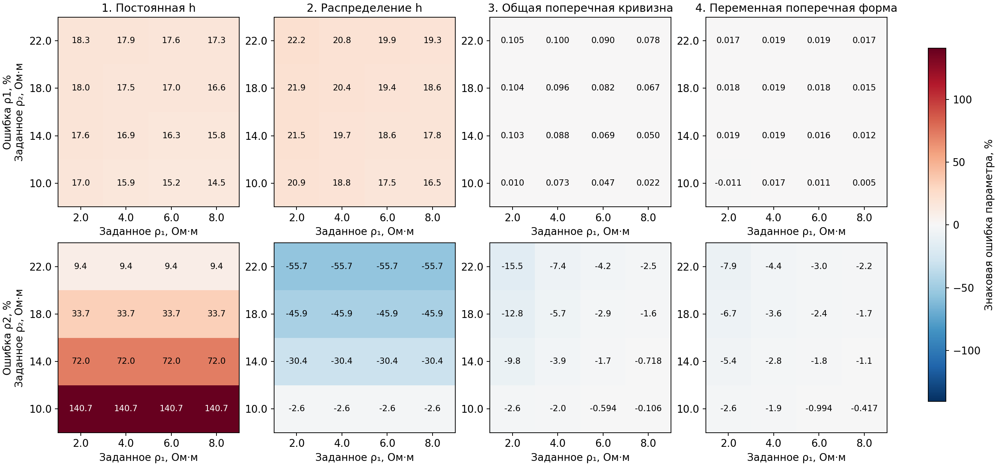

In [9]:
show_figure('05_inverse_errors.png')

**Рисунок 5. Ошибки восстановления двух сопротивлений для 16 заданных состояний.** Столбцы панелей соответствуют четырём моделям. Верхний ряд показывает ошибку $\rho_1$, нижний — $\rho_2$. Внутри каждой панели по горизонтали задано истинное $\rho_1$, по вертикали — истинное $\rho_2$. Число в ячейке — знаковая ошибка в процентах. Для всех панелей использована общая цветовая шкала, поэтому небольшие ошибки пространственных моделей следует читать по числам, а не только по цвету.

Первая и вторая модели систематически смещают сопротивления; во всех 16 случаях их оценки достигают границы допустимой области. Физиологическое ограничение не позволяет алгоритму получить произвольное сопротивление, но само по себе не исправляет модель. Для двух пространственных вариантов ошибки существенно меньше. Следующая таблица сводит абсолютные ошибки и число граничных решений, чтобы сравнение не зависело от выбранной цветовой шкалы.

In [10]:
q = inverse.assign(abs1=inverse.error1_pct.abs(), abs2=inverse.error2_pct.abs())
summary = q.groupby('model').agg(median1=('abs1','median'),max1=('abs1','max'),
    median2=('abs2','median'),max2=('abs2','max'),rmse=('rmse_ohm','median'),bounds=('on_bound','sum')).reindex(order).reset_index()
table(summary, {'model':'Модель','median1':'Медиана |e₁|, %','max1':'Максимум |e₁|, %',
    'median2':'Медиана |e₂|, %','max2':'Максимум |e₂|, %','rmse':'Медиана RMSE, Ом','bounds':'На границе, из 16'})

Модель,"Медиана |e₁|, %","Максимум |e₁|, %","Медиана |e₂|, %","Максимум |e₂|, %","Медиана RMSE, Ом","На границе, из 16"
1. Постоянная h,17.015,18.318,52.851,140.741,9.724,16
2. Распределение h,19.573,22.183,38.151,55.721,10.859,16
3. Общая поперечная кривизна,0.080,0.105,2.755,15.490,0.027,1
4. Переменная поперечная форма,0.017,0.019,2.494,7.864,0.003,1
КТ-референс,0.000,0.000,0.000,0.000,0.000,0


**Промежуточный вывод.** Среди четырёх кандидатов переменная поперечная форма дала наименьшие медиану и максимум ошибки обоих сопротивлений: для $\rho_2$ около **2,49%** и **7,86%**. Для общей кривизны эти значения составили **2,75%** и **15,49%**. Преимущество по медиане $\rho_2$ умеренное, а по наихудшему случаю — существенное. У обоих пространственных приближений остаётся по одному решению на границе. Поэтому четвёртая модель является ведущим кандидатом по выбранным сводным критериям, но не объявляется лучшей в каждом отдельном состоянии.

Строка «КТ-референс» — контроль: данные порождены исходной КТ-геометрией, и сопротивления восстановлены оператором той же геометрии. Её почти нулевая ошибка характеризует интерполяцию и инверсию, а не отсутствие физической ошибки КТ/FEM. **Плоская модель здесь не является эталоном и не получает нулевую ошибку по определению.**

Остаётся объяснить, почему столь небольшая ошибка рассчитанного импеданса у четвёртой модели всё же сопровождается процентной ошибкой $\rho_2$. Для этого рассмотрим одно состояние подробно.

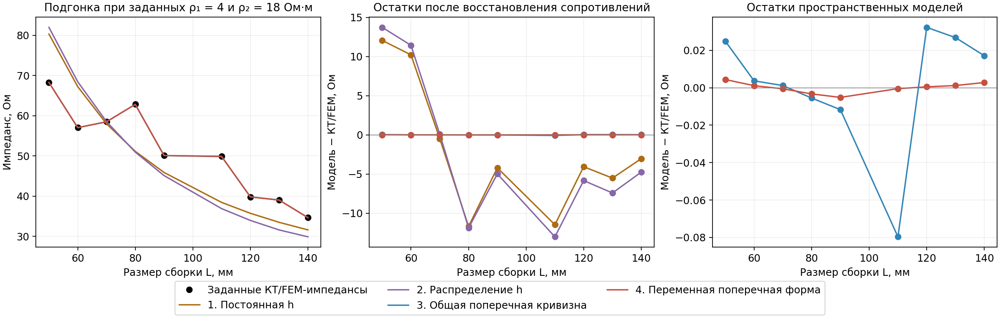

In [11]:
show_figure('06_impedance_fit.png')

**Рисунок 6. Подгонка импедансов при истинных $\rho_1=4$ и $\rho_2=18$ Ом·м.** Слева показаны девять заданных КТ/FEM-импедансов и прогнозы моделей после восстановления сопротивлений; в центре — остатки «модель минус референс» для всех моделей, справа — увеличенный масштаб остатков двух пространственных вариантов. Горизонтальная ось — номинальный размер сборки. Близкие линии слева не обязательно означают близкие тканевые параметры; для оценки малых расхождений служат правая панель и таблица ниже.

Для переменной формы получено $\widehat\rho_1\approx4{,}0008$ и $\widehat\rho_2\approx17{,}3430$ Ом·м: ошибка лёгочного параметра составляет **−3,65%**, хотя RMSE импеданса всего **0,00275 Ом**. Для общей кривизны ошибка $\rho_2$ равна **−5,67%**, RMSE — **0,03197 Ом**. Малый остаток означает, что модель объяснила измерения своим набором параметров. Он не гарантирует, что этот набор совпадает с исходными сопротивлениями: изменение геометрии и компенсация между двумя тканевыми вкладами могут давать близкие импедансы.

In [12]:
example = inverse.query('rho1_true==4 and rho2_true==18').set_index('model').reindex(order).reset_index()
table(example, {'model':'Модель','rho1':'Восстановленное ρ₁, Ом·м','rho2':'Восстановленное ρ₂, Ом·м',
                'error2_pct':'Ошибка ρ₂, %','rmse_ohm':'RMSE, Ом'}, decimals=5)
# Повторная ограниченная инверсия одного состояния из нормированной библиотеки.
sys.path.insert(0, str(root/'tools'))
from transverse_geometry_analysis import Operator
raw = pd.read_csv(out/'pem_library.csv')
part = raw[raw.model=='variable_transverse']
knots = np.asarray(geometry['knots'])
selected = [part.ratio.unique()[np.argmin(abs(part.ratio.unique()-x))] for x in knots]
part = part[part.ratio.isin(selected)]
f = part.pivot(index='ratio',columns='L_mm',values='f').sort_index()
df = part.pivot(index='ratio',columns='L_mm',values='df_dlogq').sort_index()
operator = Operator(f.index.to_numpy(),f.to_numpy(),df.to_numpy(),geometry['bounds_ohm_m'])
source = raw[(raw.model=='reference') & np.isclose(raw.ratio,4.5)].sort_values('L_mm')
rho_repeated, residual = operator.fit(4*source.f.to_numpy())
saved = example[example.model=='variable_transverse'][['rho1','rho2']].to_numpy()[0]
np.testing.assert_allclose(rho_repeated,saved,rtol=1e-9)
print('Повторное восстановление в ячейке совпало с сохранённым результатом.')

Модель,"Восстановленное ρ₁, Ом·м","Восстановленное ρ₂, Ом·м","Ошибка ρ₂, %","RMSE, Ом"
1. Постоянная h,4.69951,24.07407,33.74485,8.11219
2. Распределение h,4.81450,9.74127,-45.88183,9.22942
3. Общая поперечная кривизна,4.00383,16.97982,-5.66768,0.03197
4. Переменная поперечная форма,4.00077,17.34300,-3.64997,0.00275
КТ-референс,4.00000,18.00001,0.00003,0.00000


Повторное восстановление в ячейке совпало с сохранённым результатом.


## 7. Отдельная проверка с конечными электродными площадками

Предыдущее сравнение использовало точечные контакты. Чтобы проверить, сохраняется ли результат при конечной площади, исходная двухтканная КТ/CEM-модель сформировала девять импедансов при **$\rho_1=4$, $\rho_2=16$ Ом·м**. Затем две пространственные аппроксимации независимо восстановили оба сопротивления прямыми CEM-решениями с теми же площадками и тем же $z_c$.

Применён ограниченный нелинейный метод наименьших квадратов в логарифмах сопротивлений с точным сопряжённым Якобианом. Для каждой модели использованы две начальные точки: предварительная оценка точечного оператора по конечным контактным данным и геометрический центр диапазонов. Итоговые точки и признаки сходимости сохранены для обоих запусков. Ни положение сборок, ни площадь, ни контактное сопротивление не подгонялись.

Это проверка одного базового состояния. Она не заменяет весь 16-состоянийный опыт и не доказывает, что точечные электроды допустимы при любых сопротивлениях. В частности, разность PEM–CEM включает и конечную площадь, и перенос точечного контакта в узел сетки.

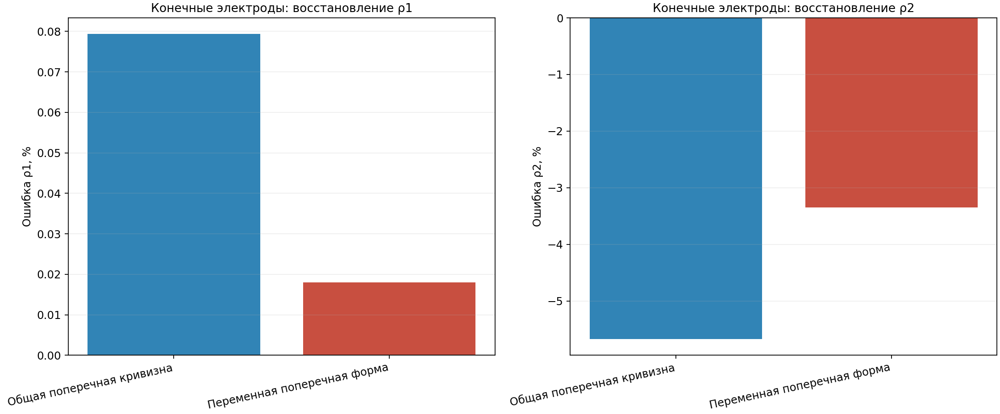

In [13]:
show_figure('09_cem_inverse.png')

**Рисунок 7. Ошибки восстановления с согласованными конечными площадками.** Левая панель показывает знаковую ошибку $\rho_1$, правая — $\rho_2$. Для каждого геометрического приближения выбран завершившийся запуск с меньшей целевой функцией; расхождения между двумя начальными точками приведены в таблице.

При общей кривизне ошибка $\rho_2$ составила **-5.674%**, при переменной форме — **-3.345%**. Соответствующие RMSE равны **0.01777** и **0.00276 Ом**. Это непосредственные результаты конечной электродной модели, а не пересчёт точечной формулы с поправкой на площадь.

In [14]:
cem_inverse = pd.read_csv(out/'cem_inverse.csv')
cem_inverse['converged'] = np.where(cem_inverse.exitflag>0,'да','нет')
table(cem_inverse, {'model':'Модель','start_index':'Начальная точка','rho1':'ρ₁, Ом·м','rho2':'ρ₂, Ом·м',
      'error2_pct':'Ошибка ρ₂, %','rmse_ohm':'RMSE, Ом','converged':'Сходимость'}, decimals=5)

Модель,Начальная точка,"ρ₁, Ом·м","ρ₂, Ом·м","Ошибка ρ₂, %","RMSE, Ом",Сходимость
3. Общая поперечная кривизна,1,4.00318,15.09218,-5.67390,0.01777,да
3. Общая поперечная кривизна,2,4.00318,15.09218,-5.67390,0.01777,да
4. Переменная поперечная форма,1,4.00072,15.46474,-3.34539,0.00276,да
4. Переменная поперечная форма,2,4.00072,15.46474,-3.34539,0.00276,да


Совпадение решений из двух начальных точек служит проверкой устойчивости данной подгонки к инициализации. Оно не доказывает единственность решения при всех исходных данных. После этой проверки можно рассматривать главный практический вопрос: как ошибка базового восстановления влияет на параметры, рассчитанные в следующем дыхательном состоянии и на пульсовую составляющую.

## 8. Дыхательные состояния и перенос ошибки в пульсовую составляющую

Базовое состояние A задано как $\rho_1=4$, $\rho_2=16$ Ом·м в исходной КТ-геометрии. Для условного глубокого дыхательного перехода в состоянии B принято $\rho_2=12$ Ом·м, для обычного — $14{,}4$ Ом·м. Эти величины задают разные амплитуды вычислительного теста; они не являются установленными амплитудами дыхания добровольца. В отдельном сценарии базовое сопротивление фона в B увеличено на 1%, до 4,04 Ом·м.

Геометрические сценарии задают локальное смещение поля лёгкого вдоль $d$. Для глубокого перехода проверены отдельно смещения −2 и +2 мм относительно A, для обычного — −1 и +1 мм. **Каждая пара A–B имеет размах 2 или 1 мм; два противоположных варианта не объединяются в один цикл с удвоенным размахом.** Использовано то же окно сопряжения с неподвижной внешней КТ. Такая деформация — управляемая модельная проверка, а не измеренное движение диафрагмы. При сложной поверхности её нельзя автоматически считать одинаковым изменением нормальной толщины во всех точках.

В каждом сценарии сначала независимо восстановлены базовые сопротивления A и B, затем вычислена разность $\Delta\rho_j^{\mathrm{дых}}=\widehat\rho_{j,B}-\widehat\rho_{j,A}$. При нулевом истинном изменении $\rho_1$ ошибка оценивается в Ом·м, чтобы не делить на ноль. Геометрия обратного оператора при этом остаётся исходной: так измеряется последствие игнорирования известного модельного движения.

Для пульса в B заданы малые приращения $\delta\rho_1=10^{-4}\rho_{1,B}$ и $\delta\rho_2=10^{-3}\rho_{2,B}$. Это отдельное тестовое соотношение амплитуд, а не физиологическая норма. Синтетический пульсовой импеданс вычислен в первом порядке:

$$\delta\mathbf Z=J_{\mathrm{КТ},B}\,\delta\boldsymbol\rho^*,\qquad
   \widehat{\delta\boldsymbol\rho}=J_{\mathrm{модель}}(\widehat{\boldsymbol\rho}_B)^+\,\delta\mathbf Z,$$

где $J_{ij}=\partial Z_i/\partial\rho_j$, а знак $+$ обозначает решение линейной задачи наименьших квадратов. Якобиан приближения вычисляется именно в восстановленном базовом состоянии, поэтому ошибка предыдущих этапов переносится в пульсовую оценку. Движение во время самого пульса здесь не задавалось; это не расчёт сердечного объёма и не полная модель сердечного цикла.

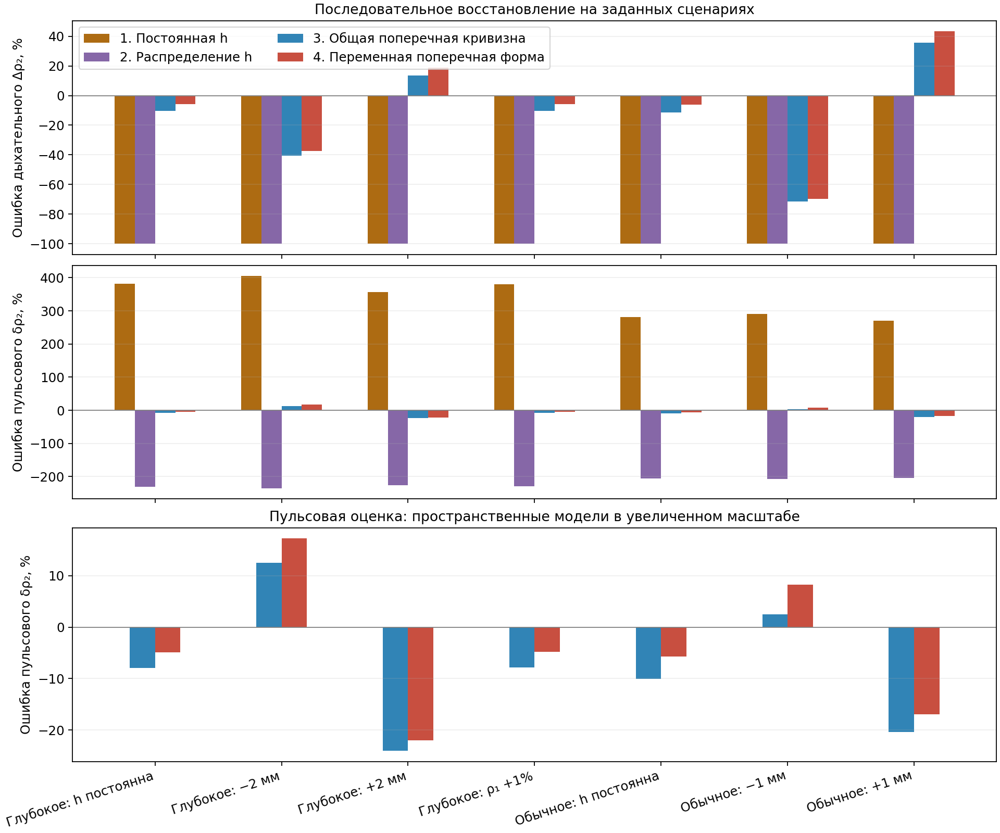

In [15]:
show_figure('07_linked_errors.png')

**Рисунок 8. Ошибки дыхательной и пульсовой оценки $\rho_2$ после последовательного восстановления.** По горизонтали — семь отдельных заданных сценариев; столбики сравнивают модели. Верхняя панель показывает ошибку дыхательной разности $\Delta\rho_2$, средняя — пульсового приращения $\delta\rho_2$ для всех моделей, нижняя — те же пульсовые ошибки только для пространственных вариантов в увеличенном масштабе. Оба показателя нормированы на ненулевую истинную величину соответствующего сценария. Эти проценты нельзя сравнивать как одинаковые абсолютные изменения ткани.

При неподвижной геометрии переменная модель даёт около **−5,82%** ошибки глубокой дыхательной разности и **−6,22%** обычной; ошибка пульсовой оценки составляет примерно **−4,87%** и **−5,66%**. При игнорировании смещения лёгкого ошибка дыхательной разности достигает по модулю **37,23%** для заданного глубокого перехода и **69,72%** для обычного. Больший относительный эффект в обычном сценарии связан в том числе с меньшей заданной дыхательной разностью: одинаковая по порядку геометрическая примесь занимает большую её долю.

Рисунок показывает, что хорошего описания одной исходной геометрии недостаточно. В этой постановке неизвестное дыхательное движение способно стать более сильным ограничением, чем переход от общей поперечной кривизны к переменной форме. Ни допустимые 1–2 мм, ни близкая подгонка базового импеданса не являются достаточным основанием считать движение несущественным.

### 8.1. Две разные гипотезы об исключении фоновой ткани

Проверка постоянства **базового** $\rho_1$ при дыхании выполнена совместной подгонкой двух состояний с одним общим $\rho_1$ и двумя значениями $\rho_2$. Проверка отсутствия **пульсового** изменения $\rho_1$ выполнена отдельно: весь пульсовой импеданс объясняется только вторым столбцом Якобиана. Эти ограничения относятся к разным величинам и не следуют одно из другого.

In [16]:
d = dynamic[dynamic.model.isin(['reference','variable_transverse'])].copy()
scenario_labels = {'fixed_deep':'Глубокое, геометрия постоянна', 'rho1_deep':'Глубокое, ρ₁ увеличено на 1%',
   'h_minus2_deep':'Глубокое, смещение −2 мм','h_plus2_deep':'Глубокое, смещение +2 мм',
   'fixed_quiet':'Обычное, геометрия постоянна','h_minus1_quiet':'Обычное, смещение −1 мм','h_plus1_quiet':'Обычное, смещение +1 мм'}
d['scenario'] = d.scenario.replace(scenario_labels)
table(d, {'scenario':'Сценарий','model':'Модель','delta1_error_ohm_m':'Ошибка дыхательного Δρ₁, Ом·м',
   'delta2_error_pct':'Ошибка Δρ₂, %','shared_delta2_error_pct':'Ошибка Δρ₂ при общем ρ₁, %',
   'pulse1_error_pct':'Ошибка пульсового δρ₁, %','pulse2_error_pct':'Ошибка пульсового δρ₂, %','pulse2_if_no_soft_error_pct':'Ошибка δρ₂ без δρ₁, %'}, decimals=6)

Сценарий,Модель,"Ошибка дыхательного Δρ₁, Ом·м","Ошибка Δρ₂, %","Ошибка Δρ₂ при общем ρ₁, %","Ошибка пульсового δρ₁, %","Ошибка пульсового δρ₂, %","Ошибка δρ₂ без δρ₁, %"
"Глубокое, геометрия постоянна",КТ-референс,0.000000,-0.000089,-0.000095,0.000021,0.001039,247.554807
"Глубокое, геометрия постоянна",4. Переменная поперечная форма,-0.000048,-5.823790,-5.716087,0.075490,-4.874387,229.972834
"Глубокое, ρ₁ увеличено на 1%",КТ-референс,0.000000,-0.000055,-92.633233,0.000020,0.001006,246.209821
"Глубокое, ρ₁ увеличено на 1%",4. Переменная поперечная форма,-0.000043,-5.905558,-92.993997,0.076879,-4.834651,228.844801
"Глубокое, смещение −2 мм",КТ-референс,0.001806,-33.191326,-37.799173,0.411616,23.832683,316.369946
"Глубокое, смещение −2 мм",4. Переменная поперечная форма,0.001782,-37.232684,-41.498607,0.478648,17.216099,293.338814
"Глубокое, смещение +2 мм",КТ-референс,-0.001250,25.926732,28.769103,-0.135961,-18.354983,196.853212
"Глубокое, смещение +2 мм",4. Переменная поперечная форма,-0.001325,18.816328,21.649373,-0.056050,-22.019673,182.972734
"Обычное, геометрия постоянна",КТ-референс,0.000000,-0.000360,-0.000384,0.000016,0.000734,274.485865
"Обычное, геометрия постоянна",4. Переменная поперечная форма,-0.000012,-6.221634,-6.145532,0.051499,-5.658728,252.368362


**Результат проверки допущений.** Даже для оператора с правильной исходной геометрией принудительное постоянство $\rho_1$ при его истинном увеличении на 1% даёт около **−92,63%** ошибки дыхательной разности $\rho_2$. Свободная оценка обоих базовых сопротивлений в том же неподвижном сценарии воспроизводит заданные значения с численной точностью. Поэтому это пример ошибки дополнительного ограничения, а не доказательство непригодности исходного FEM.

Исключение фонового пульсового приращения также существенно: в неподвижном глубоком сценарии ошибка $\delta\rho_2$ для правильного КТ-оператора составляет около **+247,55%**, а для переменной геометрии — **+229,97%**. Малое относительное изменение фонового сопротивления не гарантирует малый вклад в импеданс: оно умножается на собственную чувствительность. Эти числа относятся к выбранному соотношению пульсовых амплитуд; они не устанавливают величину примеси в записи человека.

Следовательно, ни постоянное базовое $\rho_1$, ни нулевое пульсовое $\delta\rho_1$ пока нельзя исключать только ради уменьшения числа неизвестных. Допустимость каждого ограничения требует отдельно измеренного или обоснованного предела соответствующего тканевого изменения и расчёта его влияния. Теперь проверим, как к этим систематическим смещениям добавляется неустойчивость самой инверсии.

## 9. Чувствительность, обусловленность и возмущение одного измерения

Большая производная $\partial Z/\partial\rho_2$ означает, что изменение лёгочного сопротивления сильнее влияет на сигнал. Для восстановления **двух** параметров этого недостаточно: нужно также отличить этот эффект от изменения $\rho_1$. Если два столбца Якобиана почти пропорциональны, различные сочетания сопротивлений дают похожие изменения импедансов.

Для сравнения относительных изменений используется матрица $J_{\ln\rho}=J\,\operatorname{diag}(\rho_1,\rho_2)$. Число обусловленности определяется как

$$\kappa_J=\frac{s_{\max}(J_{\ln\rho})}{s_{\min}(J_{\ln\rho})},$$

где $s_{\max}$ и $s_{\min}$ — её наибольшее и наименьшее сингулярные значения. Чем меньше последнее значение, тем слабее наблюдается одно из сочетаний параметров. При выбранных единицах и весах большая $\kappa_J$ указывает на опасность усиления возмущений. Она не задаёт процент ошибки и не является доверительным интервалом. Без установленной ковариации измерений и модели систематического расхождения не рассчитывается заявленная статистическая точность или граница Крамера–Рао.

Проведён детерминированный тест: один из девяти импедансов каждого из 16 состояний увеличивается или уменьшается на 1%, остальные сохраняются. Всего для пяти операторов, включая контроль, получено **1440 повторных инверсий**. Такой тест исследует чувствительность к локальному возмущению, а не вводит гауссовский шум или измеренную точность прибора.

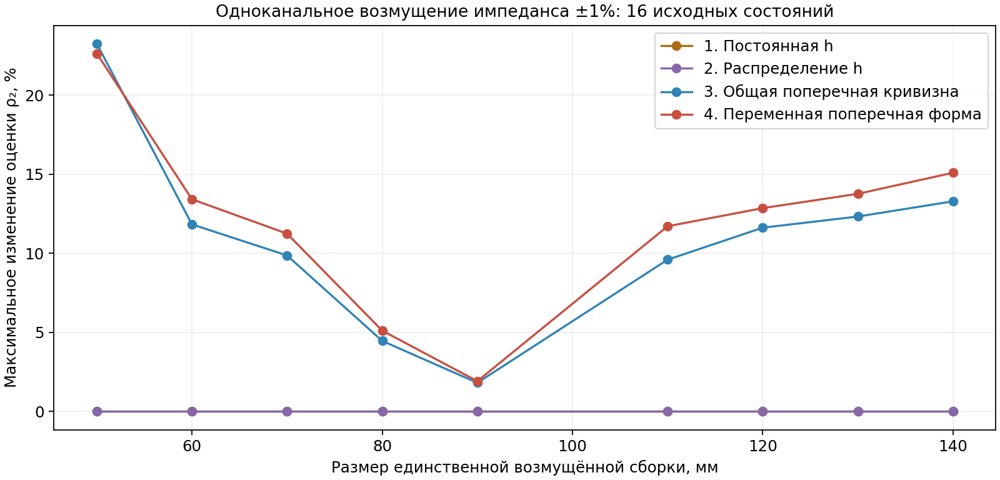

In [17]:
show_figure('08_perturbations.png')

**Рисунок 9. Изменение оценки $\rho_2$ при одноканальном возмущении импеданса.** По горизонтали указан размер единственной изменённой сборки. По вертикали — максимальное по 16 состояниям и двум знакам возмущения относительное изменение оценки $\rho_2$ по сравнению с её невозмущённой оценкой. Это мера локальной устойчивости результата данного алгоритма, а не полная ошибка относительно истинного сопротивления.

Для переменной формы максимум по всему тесту составляет около **22,64%**, для общей кривизны — **23,26%**, для КТ-контроля — **24,36%**. Следовательно, даже точный геометрический оператор в этой позиции может плохо разделять тканевые параметры при изменении одного измерения.

Нулевая реакция двух аналитических моделей здесь не является преимуществом. Их $\rho_2$ уже закреплено на границе допустимого диапазона и остаётся там после малого возмущения. Это насыщение ограниченной оценки, сочетающееся с большой исходной ошибкой. Устойчивость необходимо читать вместе с ошибкой рисунка 5 и отметками о границах.

Для всех 36 пар размеров дополнительно рассчитаны ошибки и обусловленность в одном базовом состоянии. Эти результаты сохранены для планирования следующего этапа. Выбирать окончательную пару по одному состоянию и локальному числу обусловленности преждевременно: нужно повторить ограниченную инверсию по диапазону сопротивлений, дыхательным сценариям, конечным контактам и ошибкам установки.

Полученное различие между точностью геометрии и наблюдаемостью параметров объясняет, почему анатомически удобное для двуслойного приближения место не обязательно оптимально для $\rho_2$. В таком месте лёгкое может давать слишком слабый или слишком похожий на фон набор откликов. Для уточнения этой причины далее рассматривается распределение чувствительности по глубине.

## 10. Проверка условной глубины чувствительности $L/3$

У тетраполярного измерения нет универсальной резкой границы чувствительности на глубине одной трети длины сборки. В работе [Islam, Rabbani и Wilson, 2010](https://pubmed.ncbi.nlm.nih.gov/20647612/) обсуждается максимум усреднённой по плоскости чувствительности конфигураций фокусированного импедансного измерения на глубине, связанной с расстоянием между токовым и измерительным электродами. Это другое геометрическое определение расстояния и характеристика распределения, а не обнуление чувствительности всех более глубоких тканей.

Здесь выполнена собственная проверка для исходной КТ-геометрии, точечных электродов и $\rho_1=4$, $\rho_2=16$ Ом·м. По прямому и сопряжённому полям рассчитана поэлементная чувствительность

$$S_e=\frac{1}{\rho_e}\int_{\Omega_e}\nabla u_I\cdot\nabla u_V\,dV,$$

где оба поля соответствуют единичным токам своей пары, $\rho_e$ — сопротивление ткани элемента. Величина $S_e$ есть производная $Z$ по локальному $\ln\rho_e$ и уже учитывает объём элемента. Проверено правило суммы $\sum_eS_e=Z$ для точечной резистивной модели. Отдельные элементы могут иметь отрицательную чувствительность; это свойство передаточного измерения, а не отрицательная проводимость.

Глубина элемента определена как кратчайшее евклидово расстояние от его центра до внешней STL-поверхности кожи. Она отличается от координаты $d$ в центральных срезах и не задаёт направление распространения тока. Для описания пространственного охвата использованы веса $|S_e|$; поэтому приведённые доли относятся к абсолютной чувствительности, а не к положительным долям самого импеданса.

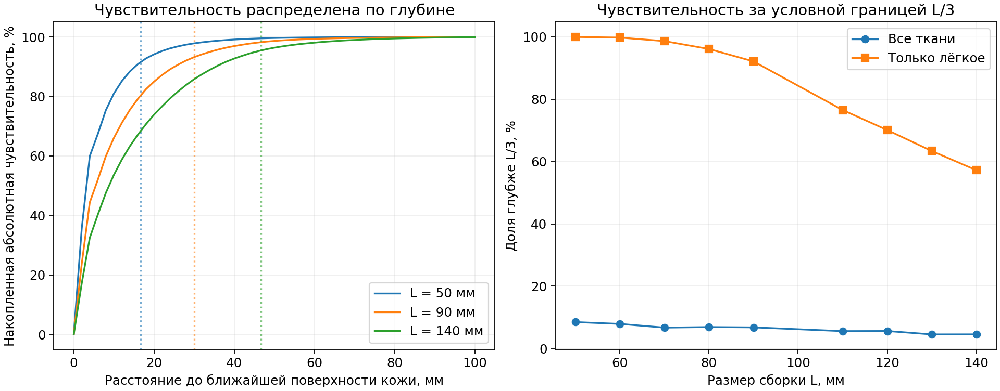

In [18]:
show_figure('10_depth_sensitivity.png')

**Рисунок 10. Распределение чувствительности по расстоянию до кожи.** Слева показана накопленная сумма $|S_e|$ для сборок 50, 90 и 140 мм, нормированная на сумму по всему телу. Пунктирные вертикали соответствуют $L/3$ каждой сборки. Справа показана доля абсолютной чувствительности глубже $L/3$: отдельно среди всех тканей и отдельно внутри лёгкого. Во втором случае знаменатель содержит только лёгочные элементы, поэтому две кривые нельзя трактовать как доли одного общего целого.

Для сборки 140 мм глубже **46,67 мм** остаётся **4.549%** абсолютной чувствительности всего объёма и **57.201%** абсолютной чувствительности лёгкого. Значения для всех размеров приведены ниже. Даже небольшая доля от суммарного чувствительного объёма может быть существенной частью лёгочного отклика. Поэтому критерий исключения глубокой границы должен оцениваться по ошибке восстанавливаемого $\rho_2$, а не только по отношению геометрической глубины к длине сборки.

Расчёт относится к одной паре сопротивлений и точечным контактам. Ближайшая поверхность кожи может находиться сбоку от рассматриваемой сборки; выбранная глубина является геометрической характеристикой, а не единственной возможной мерой проникновения. Карта чувствительности не доказывает малость сердца или других отдельных органов, поскольку в этом опыте они объединены с фоном.

In [19]:
dep = pd.read_csv(out/'depth_sensitivity_summary.csv')
table(dep, {'L_mm':'Размер L, мм','threshold_mm':'L/3, мм','absolute_beyond_pct':'Глубже L/3, все ткани, %',
            'lung_absolute_beyond_pct':'Глубже L/3, лёгкое, %',
            'lung_signed_log_sensitivity_ohm':'∂Z/∂lnρ₂, Ом','soft_signed_log_sensitivity_ohm':'∂Z/∂lnρ₁, Ом'})

"Размер L, мм","L/3, мм","Глубже L/3, все ткани, %","Глубже L/3, лёгкое, %","∂Z/∂lnρ₂, Ом","∂Z/∂lnρ₁, Ом"
50,16.667,8.484,99.978,0.470,67.746
60,20.000,7.900,99.777,0.574,56.402
70,23.333,6.717,98.649,0.723,57.693
80,26.667,6.889,96.113,1.136,61.572
90,30.000,6.794,92.121,1.230,48.741
110,36.667,5.584,76.519,1.785,47.934
120,40.000,5.614,70.088,1.818,37.778
130,43.333,4.535,63.374,1.878,36.923
140,46.667,4.549,57.201,2.016,32.402


## 11. Влияние геометрической дискретизации и границы применимости

Отдельный контроль заменил исходную лёгочную маску только её интерполяцией на геометрической сетке, без общей или переменной поперечной аппроксимации. При $\rho_1=4$, $\rho_2=16$ Ом·м это изменило импеданс максимум на **0,00113 Ом** и дало ошибку восстановления $\rho_2$ около **−0,053%**. В данном контроле геометрическое интерполирование существенно слабее влияет на результат, чем основные приближения.

При локальном сдвиге исходной лёгочной области на −2 и +2 мм и восстановлении по неподвижной КТ ошибка базового $\rho_2$ составила соответственно **+15,68%** и **−12,05%**; для −1 и +1 мм — **+8,45%** и **−6,61%**. Это отдельный базовый тест, в котором сопротивления не менялись. В дыхательных сценариях рисунка 8 дополнительно менялось само $\rho_2$, поэтому численные ошибки этих двух проверок различаются.

Допущения ограничивают выводы следующим образом:

| Допущение или ограничение | Для чего введено | Что остаётся непроверенным |
|---|---|---|
| Одна КТ и одна зафиксированная поза | Изолировать влияние локальной геометрии | Перенос на другие места и людей; фактическая установка |
| Две изотропные резистивные ткани | Проверить поставленную двухпараметрическую задачу | Отдельные свойства костей, сердца, других тканей; анизотропия и комплексный импеданс |
| Исходная КТ за пределами окна | Сохранить общую дальнюю анатомию | Возможность полностью заменить лёгкое локальной параметрической поверхностью |
| Одна тетраэдральная сетка | Обеспечить согласованное сравнение | Полная ошибка пространственной дискретизации и контактов |
| Точечные контакты в основном опыте | Использовать масштабирование и быструю библиотеку | Все состояния с конечными площадками; неизвестная контактная вариабельность |
| Одинаковые веса остатков | Задать явный критерий без выдуманной статистики | Влияние реальной неоднородной ошибки измерений |
| Заданные дыхательные смещения | Измерить риск игнорирования 1–2 мм | Идентификация движения по данным конкретного человека |
| Малые заданные пульсовые изменения | Проследить перенос ошибок в Якобиан | Реальные амплитуды, знаки, временная динамика и пульсовое движение |
| Библиотека FEM по контрасту | Ускорить повторные инверсии | Независимый быстрый решатель и перенос библиотеки на другую геометрию |

## 12. Выводы и следующий вычислительный эксперимент

**Подтверждено выполненным модельным расчётом:** при фиксированной позиции и согласованных точечных контактах переменная поперечная форма уменьшает сводные ошибки обратного восстановления относительно общей кривизны и двух аналитических приближений. Простое усреднение профиля $h(s)$ в выбранной реализации не даёт пригодной замены пространственной модели. Отдельный CEM-расчёт выше определяет результат перехода к конечным площадкам для одного базового состояния; его область проверки уже, чем основная сетка сопротивлений.

**Главное ограничение для практической инверсии:** даже правильная исходная геометрия не устраняет неустойчивость разделения двух сопротивлений, влияние дыхательного движения и ошибку необоснованного исключения фонового вклада. В этой позиции нужны одновременно достаточно точная геометрия и измерения, различающие две ткани. Минимальная ошибка базового импеданса не заменяет проверку базового, дыхательного и пульсового параметров по отдельности.

При доступной индивидуальной КТ и фиксированной геометрии полная КТ-библиотека уже позволяет выполнять быструю повторную инверсию без нового FEM на каждом шаге. Поэтому ухудшать её геометрию ради одной лишь интерполяции нет основания: такое ускорение общее для референса и приближений. Дальнейшее сокращение формы должно дать самостоятельное преимущество — например, более дешёвую подготовку, удобное описание дыхательного движения или перенос между людьми — при допустимой дополнительной ошибке.

Следующий этап использует четвёртую модель как кандидат для такого сокращения, сохраняя библиотеку полной КТ в качестве вычислительного референса:

1. **Совместно оценить дыхательную геометрию и сопротивления.** Сначала ввести один явный параметр движения с КТ-опорой, проверить его различимость с $\rho_2$ и затем определить, когда можно зафиксировать движение в пределах принятой точности. Одни ограничения размаха 1–2 мм этого не обеспечивают.
2. **Проверить устойчивость на независимой дискретизации и конечных контактах по диапазону состояний.** Это отделит геометрическое улучшение от ошибок общей сетки и от эффекта площади электрода.
3. **Сократить карты поперечной формы.** Последовательно уменьшать число коэффициентов, каждый раз повторяя обратное восстановление. Метрика сокращения — прирост ошибки тканевых параметров и их изменений, а не только ошибка поверхности.
4. **Выбрать ограниченный набор сборок.** Сравнить пары и, при необходимости, тройки по наихудшей ошибке в диапазоне сопротивлений, при дыхательном движении, ошибках положения и контакта. Отдельно задать допускаемую точность каждого выходного параметра. Если пара не обеспечивает её, это должно быть сохранено как отрицательный результат.
5. **Проверить анатомическое правило выбора места в ветке 20.15.** На нескольких доступных КТ оценить не только двуслойную похожесть и удалённость от сердца/прочих органов, но и различимость $\rho_1$ и $\rho_2$. Геометрически более простое место может оказаться электрически менее информативным.

Указанные шаги сохраняют связь с полной индивидуальной постановкой. Отказываться от геометрической информации или тканевого параметра можно после оценки дополнительной ошибки такого отказа. Настоящий опыт определяет перспективный способ описания поперечной формы и показывает, какие следующие упрощения требуют наиболее строгой проверки.

### 12.1. Выбор метода расчёта импеданса по точности и вычислительной стоимости

**Цель, утверждённая автором 14.09.2026.** Найти обоснованную методику быстрого и достаточно точного расчёта импеданса двухтканной области под боковыми электродными сборками. Предпочтительность расчёта без FEM должна следовать из сравнения точности и затрат. Сохранение FEM как основного метода также является содержательным результатом исследования. Обязательность FEM можно установить только относительно проверенных альтернатив, условий измерения и требований к точности; универсальная невозможность других методов из такого опыта не следует.

Требуемая точность прямой модели определяется её применением в обратной задаче. Проверяются ошибки импеданса в омах, чувствительностей и восстановленных $\rho_1$, $\rho_2$, а также дыхательных и пульсовых изменений обеих тканей. Сопротивления испытываются в принятых рабочих литературных диапазонах. Для истинно нулевого изменения используется абсолютная ошибка. Малый остаток подгонки импеданса и попадание оценок в физиологический диапазон по отдельности не подтверждают правильности восстановления.

**Что уже рассчитано.** Первая и вторая модели используют аналитические плоские ядра. Третья, четвёртая и исходная КТ-модель рассчитаны FEM на общей сетке доступного объёма тела; локальное окно задаёт замену лёгочной геометрии, но не электрическую границу. Быстрая библиотека для точечных электродов получена предварительными FEM-расчётами. Самостоятельного поверхностного решателя, компактной полуаналитической модели и сравнения их времени с FEM в настоящем опыте ещё нет. Результаты разделов 6–11 не являются результатами такого сравнения.

**Научное основание следующего этапа.** Для кусочно-однородного объёмного проводника задача потенциала допускает представление через интегральные уравнения на границах тканей. Трёхмерная постановка и её сравнение с FEM описаны у [Stenroos, 2016, разделы 2–3](https://arxiv.org/pdf/1605.00923v3#page=2). Это основание проверить метод граничных элементов (BEM): неизвестные определяются на поверхностях, а не во всём тетраэдральном объёме. BEM остаётся численным методом; наличие интегрального представления не означает готовой элементарной формулы для произвольного лёгкого.

Учёт конечных электродов и контактного сопротивления в граничной интегральной постановке продемонстрирован в двумерной работе [Tyni, Stinchcombe, Alexakis, 2024](https://doi.org/10.1137/23M1585696). Формулы чувствительности к деформации границ для полной электродной модели рассмотрены в двух и трёх измерениях у [Ren и соавт., 2018, раздел 2](https://purehost.bath.ac.uk/ws/portalfiles/portal/157818465/GIPE_2016_0202_R2.pdf#page=3). Эти публикации обосновывают выбор проверяемых методов. Они не устанавливают их скорость и точность для наших боковых сборок, диапазонов сопротивлений или смещений 1–2 мм.

**Предлагаемая постановка.** Сначала сравнить FEM и поверхностный решатель при одной и той же геометрии тела и лёгкого, одинаковых электродах, проводимостях и граничных условиях. Затем проверенным решателем сравнить исходную КТ-поверхность с компактными вариантами общей и переменной поперечной формы. Полный контур должен сохранять край лёгкого и поддиафрагмальную область без введения сплошного нижнего слоя мягкой ткани. Геометрические коэффициенты сначала определяются по КТ независимо от импедансов. После разделения ошибки решателя и ошибки формы можно сокращать число коэффициентов и пространственных составляющих поля либо вводить поправку для малого дыхательного движения. Последние сокращения являются предложениями для данного проекта, а не уже установленными результатами цитируемых работ.

В сравнении обязательно участвуют прямой FEM и существующая библиотека полной КТ-модели после FEM-подготовки. Дополнительные варианты М3-H и М4-H из раздела 3.4 проверяют замену наружной КТ-границы полупространством; контроль М3-Hκ отделяет эту замену от отказа от общего изгиба. Для каждой альтернативы указывается, нужен ли FEM на этапе подготовки и при изменении геометрии. Использование FEM только при разработке и проверке отделяется от обязательного FEM-расчёта для каждого нового человека или положения сборки. Точечные электроды и конечные площадки сравниваются раздельно; выигрыш, полученный заменой электродной модели, не приписывается новому решателю.

**Измерение вычислительной стоимости.** На одном оборудовании при сопоставимой подтверждённой численной точности отдельно измеряются подготовка геометрии и оператора, один прямой расчёт, расчёт производных, полное обратное восстановление и обновление при изменении дыхательной геометрии. Для повторных запусков приводятся медиана и разброс времени, число повторов, параметры параллелизма и использование кэша. Полная стоимость серии оценивается как

$$T_{\mathrm{серии}}=T_{\mathrm{подготовки}}+N\,T_{\mathrm{вызова}}+T_{\mathrm{обновлений}},$$

где $T_{\mathrm{серии}}$ — общее время серии в секундах, $T_{\mathrm{подготовки}}$ — однократная подготовка для заданной анатомии и монтажа, $N$ — число вызовов прямого оператора, $T_{\mathrm{вызова}}$ — среднее время одного вызова при явно указанном составе вычислений, $T_{\mathrm{обновлений}}$ — суммарное время перестроения оператора при изменении геометрии. Время всей обратной задачи измеряется дополнительно, поскольку оно включает оптимизацию и может требовать разного числа вызовов. Поэтому сравниваются и первый расчёт для новой геометрии, и многократные расчёты для одного человека.

**Правило принятия решения.** До выбора победителя следует численно задать допустимые ошибки импеданса, базовых сопротивлений, дыхательных и пульсовых изменений, допустимое время и практически значимый выигрыш. На дату этой редакции эти пороги не утверждены; их нельзя подбирать после просмотра результата. Новый метод принимается в тех сценариях, где он проходит требования к прямой и обратной точности и даёт подтверждённое преимущество по затратам. Если FEM существенно точнее при приемлемом времени либо сопоставим по скорости с альтернативой без преимущества по точности, FEM сохраняется как основной метод для этих сценариев. Если ни один метод не удовлетворяет требованиям, фиксируется нерешённая задача. При различном исходе для разных геометрий или дыхательных режимов задаются отдельные области применения.

Синтетические проверки используют известные заданные сопротивления, независимые дискретизации и проверку сходимости. КТ/FEM служит вычислительным референсом с собственной численной погрешностью, а не независимым измерением истинных сопротивлений человека. Перенос на другие КТ и экспериментальная валидация остаются отдельными условиями расширения области применения.

### 12.2. Научная литература к выбору метода

Ссылки ниже относятся к обоснованию нового этапа; источники тканевых диапазонов и глубинной чувствительности приведены рядом с соответствующими расчётами выше. Методический выбор и численные пороги проекта не приписываются публикациям. При дальнейшем дополнении документации ссылка на первоисточник помещается рядом с поддерживаемым утверждением и включается в список литературы; для формулы указывается раздел или номер уравнения, для заимствованного числа — условия его получения.

1. Stenroos M. *Integral equations and boundary-element solution for static potential in a general piece-wise homogeneous volume conductor*. Physics in Medicine & Biology. 2016;61(22):N606–N617. [DOI: 10.1088/0031-9155/61/22/N606](https://doi.org/10.1088/0031-9155/61/22/N606). [Открытая авторская версия, разделы 2–3](https://arxiv.org/pdf/1605.00923v3#page=2).
2. Tyni T., Stinchcombe A. R., Alexakis S. *A Boundary Integral Equation Method for the Complete Electrode Model in Electrical Impedance Tomography with Tests on Experimental Data*. SIAM Journal on Imaging Sciences. 2024;17(1):672–705. [DOI: 10.1137/23M1585696](https://doi.org/10.1137/23M1585696). Область приведённого результата — двумерная задача.
3. Ren S., Soleimani M., Xu Y., Dong F. *Inclusion boundary reconstruction and sensitivity analysis in Electrical Impedance Tomography*. Inverse Problems in Science and Engineering. 2018;26(7):1037–1061; впервые опубликовано онлайн в 2017 г. [DOI: 10.1080/17415977.2017.1378195](https://doi.org/10.1080/17415977.2017.1378195). [Принятая рукопись, раздел 2](https://purehost.bath.ac.uk/ws/portalfiles/portal/157818465/GIPE_2016_0202_R2.pdf#page=3).

4. Kurzweg U. H. *Mathematical Functions*. University of Florida, материалы курсов математического анализа; раздел «Neumann function for the infinite half space problem». [Авторский университетский источник](https://web.mae.ufl.edu/uhk/mathfunc.htm). Проверено 14.09.2026. Используется как математический источник формулы отражения, а не как исследование точности биоимпедансных измерений.

Библиографические сведения и границы применимости сверены с первоисточниками 14.09.2026. Эти работы найдены вне локальной библиотеки Zotero; просмотр её тематических коллекций и поиск по всей библиотеке не выявили соответствующих записей. Литературное обоснование не меняет статус выполненного расчёта 20.16: разработка и проверка альтернативного решателя ещё предстоят.

## 13. Воспроизведение расчёта и состав материалов

FEM и CEM выполнены MATLAB/EIDORS через единый вход `run_pipeline`. Python строит геометрические поля, аналитические операторы, ограниченные инверсии и рисунки. Ноутбук проверяет контрольные суммы входов, выполняет сводный анализ и повторяет одну обратную задачу; при обычном запуске ячеек он не запускает длительный FEM заново. Все показанные результаты сохранены в выходах ячеек.

Данные геометрии, контактов, библиотек, проверок и инверсий находятся в локальной исследовательской папке относительно MATLAB-проекта. Таблицы всех 80 базовых инверсий, 35 связанных сценариев, 1440 возмущений и 180 парных диагностик сохранены отдельно. В состав также входят четыре завершённых CEM-подгонки — по две начальные точки на пространственную модель — и поэлементная глубинная чувствительность КТ-референса.

Происхождение входов и версии исходного кода записаны в машинных манифестах. Читательский HTML содержит выводы, таблицы и рисунки; Python-код исключается при экспорте средствами `nbconvert`, а в `.ipynb` сохраняется. Команды полного воспроизведения приведены в вычислительной ячейке ниже и в документации MATLAB-проекта. Подготовка геометрии защищена от перезаписи: для нового варианта необходима новая папка результатов или явно организованный новый расчёт.

In [20]:
# Полный расчёт: команды выполняются из MATLAB_TRKG4_real_subjects.
# MATLAB:
# run_pipeline('Profile','transverse_geometry','Stage','export');
# Затем Python: python tools/transverse_geometry_study.py
# MATLAB: run_pipeline('Profile','transverse_geometry','Stage','solve');
# Python: python tools/transverse_geometry_analysis.py
# MATLAB: run_pipeline('Profile','transverse_inverse_cem');
# MATLAB: run_pipeline('Profile','transverse_depth');
# Python: python tools/transverse_depth_analysis.py
# Python: python tools/transverse_geometry_figures.py
# Python: python notebooks/build_transverse_geometry_report.py
counts = pd.DataFrame([
    ['Заданные пары сопротивлений',16],['Базовые обратные решения с контролем',len(inverse)],
    ['Связанные сценарии с контролем',len(dynamic)],
    ['Инверсии с возмущением',len(pd.read_csv(out/'perturbations.csv'))],
    ['Диагностики пар размеров',len(pd.read_csv(out/'pair_diagnostics.csv'))],
    ['Нелинейные CEM-подгонки',len(cem_inverse)],
],columns=['name','count'])
table(counts,{'name':'Выполненный расчёт','count':'Число'})

Выполненный расчёт,Число
Заданные пары сопротивлений,16
Базовые обратные решения с контролем,80
Связанные сценарии с контролем,35
Инверсии с возмущением,1440
Диагностики пар размеров,180
Нелинейные CEM-подгонки,4
